In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
cd drive/MyDrive/cs6471proj2/amazon

/content/drive/MyDrive/cs6471proj2/amazon


In [ ]:
import random
import numpy as np
import matplotlib as plt
import json
import glob

np.random.seed(42)
random.seed(42)

In [ ]:
# try to see the stats for each categories have been evaluated 

done = ["reviews_Cell_Phones_and_Accessories_5", "reviews_Toys_and_Games_5", 
        "reviews_Office_Products_5", "reviews_Pet_Supplies_5", 'reviews_Tools_and_Home_Improvement_5',
        "reviews_Automotive_5", "reviews_Digital_Music_5", "reviews_Musical_Instruments_5", 
        "reviews_Clothing_Shoes_and_Jewelry_5", "reviews_Amazon_Instant_Video_5"]

feature = 'COUNTRY'
handle = open('stats/'+feature+'_stats_4_13_v2.json', 'a')
country_list_all_file = {}
country_states_all_file = {}
all = []
total_total = 0
for done_name in done:

    print(done_name)
    json.dump(done_name, handle)
    handle.write('\n')

    file_path = '/'.join([done_name+'_all', done_name])
    file_handle = open(file_path+'_stats_v2.json', 'r')
    stats = json.load(file_handle)
    country_list = []
    country_related_sample_count_set = []
    city_list = []
    state_list = []
    year_list = []
    helpfulness = []
    country_c = 0
    feature_dict = {}

    total = sum([1 for _ in iter(open(file_path+'_feature.json', 'r'))])
    json.dump('NUMBER OF ALL HELPFULNESS SAMPLE:', handle)
    handle.write('\n')
    json.dump(total, handle) 
    handle.write('\n')

    total_total += total

    # add to each cat
    # first put things to lowercases
    for name, data in stats[feature].items():
        if name.lower() in feature_dict:
            feature_dict[name.lower()] += len(set(data[1]))
        else:
            feature_dict[name.lower()] = len(set(data[1]))
        country_related_sample_count_set = country_related_sample_count_set + data[1]
        for d in data[1]: all.append(d)

    # sort the key words by their frequency in this class
    country_list = [[name, item]for name, item in feature_dict.items()]
    country_list = sorted(country_list, key = lambda k:k[1])[::-1]

    # add to total
    for item in country_list:
        if item[0] not in country_list_all_file:
            country_list_all_file[item[0]] = item[1]
        else:
            country_list_all_file[item[0]] += item[1]

    print('NUMBER OF SAMPLE HAVING ' + feature +':', len(set(country_related_sample_count_set)))
    print('SORTED '+feature+':', country_list)

    json.dump('NUMBER OF SAMPLE:', handle)
    handle.write('\n')
    json.dump(len(set(country_related_sample_count_set)), handle) 
    handle.write('\n')
    json.dump('SORTED '+feature+':', handle)
    handle.write('\n')
    json.dump(country_list, handle) 
    handle.write('\n')

    file_handle.close()

print('ALL')
print('STATS PER ' + feature + ':', sorted([(name, item)for name, item in country_list_all_file.items() ], key=lambda k:k[1])[::-1])
print('NUMBER OF SAMPLES RELATED TO '+feature+':', len(set(all)))
print('TOTAL SAMPLE:', total_total)

json.dump('ALL', handle)
handle.write('\n')
json.dump('STATS PER '+feature+':', handle)
handle.write('\n')
json.dump(sorted([(name, item) for name, item in country_list_all_file.items() ], key=lambda k:k[1])[::-1], handle) 
handle.write('\n')

json.dump('NUMBER OF SAMPLES RELATED TO ' + feature + ':', handle)
handle.write('\n')
json.dump(len(set(all)), handle) 
handle.write('\n')

handle.close()




reviews_Cell_Phones_and_Accessories_5
NUMBER OF SAMPLE HAVING COUNTRY: 2332
SORTED COUNTRY: [['china', 865], ['us', 535], ['usa', 291], ['america', 104], ['uk', 80], ['korea', 78], ['japan', 70], ['the states', 47], ['fold', 46], ['india', 40], ['venezuela', 35], ['thule', 33], ['united states', 33], ['mx', 32], ['mexico', 28], ['ph', 24], ['australia', 24], ['canada', 22], ['germany', 22], ['france', 20], ['philippines', 19], ['brazil', 18], ['singapore', 18], ['england', 15], ['taiwan', 13], ['italy', 13], ['costa rica', 12], ['afghanistan', 10], ['dominican republic', 9], ['jamaica', 9], ['turkey', 9], ['us uk', 8], ['colombia', 8], ['peru', 8], ['vietnam', 7], ['spain', 7], ['ghana', 7], ['finland', 7], ['new zealand', 7], ['mali', 6], ['ireland', 6], ['sweden', 5], ['thailand', 5], ['united kingdom', 4], ['champa', 4], ['guinea', 4], ['south korea', 4], ['israel', 4], ['acadia', 4], ['ecuador', 4], ['argentina', 4], ['chili', 3], ['belize', 3], ['hind', 3], ['malaysia', 3], ['nort

In [ ]:
import pickle

c_list = []
for name, item in sorted([(name, item) for name, item in country_list_all_file.items() ], key=lambda k:k[1])[::-1]:
    if item > 10 and len(name.split(' '))==1:
        c_list.append(name)

print(len(c_list))
print(c_list)
with open('stats/'+feature+'_stats_4_13_v2_common_'+feature+'_list.pkl', 'wb') as handle:
    pickle.dump(c_list, handle)

98
['china', 'usa', 'us', 'america', 'uk', 'england', 'turkey', 'japan', 'guinea', 'mexico', 'germany', 'canada', 'india', 'ph', 'mx', 'australia', 'fold', 'italy', 'hind', 'france', 'taiwan', 'roc', 'vietnam', 'britain', 'ireland', 'chili', 'ch', 'thailand', 'brazil', 'korea', 'afghanistan', 'spain', 'scotland', 'singapore', 'iraq', 'russia', 'switzerland', 'panama', 'jamaica', 'sweden', 'venezuela', 'egypt', 'norway', 'philippines', 'israel', 'indonesia', 'thule', 'malaysia', 'jordan', 'chile', 'pakistan', 'bangladesh', 'poland', 'iceland', 'bahamas', 'congo', 'colombia', 'denmark', 'greece', 'madagascar', 'honduras', 'peru', 'siam', 'finland', 'columbia', 'netherlands', 'chad', 'belgium', 'chilli', 'kenya', 'cuba', 'haiti', 'ecuador', 'senegal', 'nigeria', 'prc', 'guatemala', 'cambodia', 'niger', 'tunisia', 'portugal', 'argentina', 'holland', 'austria', 'iran', 'belize', 'mex', 'bolivia', 'somalia', 'kuwait', 'barbados', 'ghana', 'burma', 'nicaragua', 'bohemia', 'hungary', 'mesopota

In [ ]:
# number of helpfulness for each categories
# historgram of ratio and number votes

In [ ]:
# to see the distribution of helpfulness and no vote data
# what is the dist of rates
# what is the dist of dates
import random
import numpy as np
import matplotlib as plt
import json
import glob

np.random.seed(42)
random.seed(42)

done = ["reviews_Cell_Phones_and_Accessories_5", "reviews_Toys_and_Games_5", 
        "reviews_Beauty_5", "reviews_Office_Products_5", "reviews_Pet_Supplies_5", 
        "reviews_Automotive_5", "reviews_Digital_Music_5", "reviews_Musical_Instruments_5", 
        "reviews_Amazon_Instant_Video_5", "reviews_Tools_and_Home_Improvement_5", "reviews_Clothing_Shoes_and_Jewelry_5"]

help_stats = {'overall':[], 'year':[]}
not_h_stats = {'overall':[], 'year':[]}
for done_name in done:
    print(done_name)
    help_stats_cat = {'overall':[], 'year':[]}
    not_h_stats_cat = {'overall':[], 'year':[]}
    count_ = 0
    for idx, line in enumerate(open(done_name+'.json', 'r')):
        review = json.loads(line)
        if int(review['helpful'][-1]) >= 1:
            help_stats_cat['overall'].append(int(review['overall']))
            help_stats_cat['year'].append(int(review['reviewTime'].split(' ')[-1]))
            count_ += 1
        else:
            not_h_stats_cat['overall'].append(int(review['overall']))
            not_h_stats_cat['year'].append(int(review['reviewTime'].split(' ')[-1]))
    
    print('HELPFULNESS RATING MEAN/DEV:', np.mean(help_stats_cat['overall']), np.std(help_stats_cat['overall']))
    print('NO HELPFULNESS RATING MEAN/DEV:', np.mean(not_h_stats_cat['overall']), np.std(not_h_stats_cat['overall']))
    print('RATING MEAN/DEV:', np.mean(not_h_stats_cat['overall']+help_stats_cat['overall']), np.std(not_h_stats_cat['overall']+not_h_stats_cat['overall']))

    print('HELPFULNESS YEAR MEAN/DEV:', np.mean(help_stats_cat['year']), np.std(help_stats_cat['year']))
    print('NO HELPFULNESS YEAR MEAN/DEV:', np.mean(not_h_stats_cat['year']), np.std(not_h_stats_cat['year']))
    print('YEAR MEAN/DEV:', np.mean(not_h_stats_cat['year']+help_stats_cat['year']), np.std(not_h_stats_cat['year']+not_h_stats_cat['year']))

    print(count_/(idx+1))



reviews_Cell_Phones_and_Accessories_5
HELPFULNESS RATING MEAN/DEV: 3.933670876545766 1.3641791307605873
NO HELPFULNESS RATING MEAN/DEV: 4.20369400608591 1.1561935249126387
RATING MEAN/DEV: 4.129912208970422 1.156193524912639
HELPFULNESS YEAR MEAN/DEV: 2012.5729074516742 1.3849624025647436
NO HELPFULNESS YEAR MEAN/DEV: 2013.0269832283632 0.9172009652057056
YEAR MEAN/DEV: 2012.902910424349 0.9172009652057056
0.27324250793307925
reviews_Toys_and_Games_5
HELPFULNESS RATING MEAN/DEV: 4.140130731428026 1.1476013477002536
NO HELPFULNESS RATING MEAN/DEV: 4.486105805958747 0.8625659923584508
RATING MEAN/DEV: 4.356307093802395 0.8625659923584508
HELPFULNESS YEAR MEAN/DEV: 2011.439333937688 2.4422845928680306
NO HELPFULNESS YEAR MEAN/DEV: 2012.7280462184874 1.4440614550713387
YEAR MEAN/DEV: 2012.2445628501703 1.4440614550713387
0.37516781326634724
reviews_Beauty_5
HELPFULNESS RATING MEAN/DEV: 4.035739305062582 1.297844864965645
NO HELPFULNESS RATING MEAN/DEV: 4.307760469278891 1.0408941383936594


In [ ]:
# I found that feature only have reviewerID, helfpulness, rate(overall), year there is no asin, unixReviewTime
# lets first check if reviewerID, helfpulness, rate(overall) is already unique in all categories
done = ["reviews_Cell_Phones_and_Accessories_5", "reviews_Toys_and_Games_5", 
        "reviews_Office_Products_5", "reviews_Pet_Supplies_5",
        "reviews_Automotive_5", "reviews_Digital_Music_5", "reviews_Musical_Instruments_5", 
        "reviews_Clothing_Shoes_and_Jewelry_5"]

# check if they have the same length
for name in done:
    print(name)
    file_path = '/'.join([name+'_all', name])
    feature_set = set()
    review_set = set()
    feature_list = []
    review_list = []
    for idx, review in enumerate(open(name+'.json', 'r')):
        this_line = json.loads(review)
        review_set.add((this_line["reviewerID"], this_line["asin"], this_line["unixReviewTime"], this_line['reviewTime'], this_line['overall']))
        review_list.append((this_line["reviewerID"], this_line["asin"], this_line["unixReviewTime"], this_line['reviewTime'], this_line['overall']))
    print('REVIEW_NUMBER:', idx+1, len(review_set), len(review_list))
    

    for idx, feature in enumerate(open(file_path+'_feature.json', 'r')):
        this_line = json.loads(feature)
        feature_set.add((this_line["reviewerID"], this_line['year'], this_line['rate']))
        feature_list.append((this_line["reviewerID"], this_line['year'], this_line['helpfulness'], this_line['rate']))
    print('FEATURE_NUMBER:', idx+1,len(feature_set), len(feature_list))

# the results is reviewID + year + helpfulness + rate is not unique
# but the number of lines of feature and review is the same
    

reviews_Cell_Phones_and_Accessories_5
REVIEW_NUMBER: 194439 194439 194439
FEATURE_NUMBER: 194439 151553 194439
reviews_Toys_and_Games_5
REVIEW_NUMBER: 167597 167597 167597
FEATURE_NUMBER: 167597 118705 167597
reviews_Office_Products_5
REVIEW_NUMBER: 53258 53258 53258
FEATURE_NUMBER: 53258 47360 53258
reviews_Pet_Supplies_5
REVIEW_NUMBER: 157836 157836 157836
FEATURE_NUMBER: 157836 117014 157836
reviews_Automotive_5
REVIEW_NUMBER: 20473 20473 20473
FEATURE_NUMBER: 20473 15239 20473
reviews_Digital_Music_5
REVIEW_NUMBER: 64706 64706 64706
FEATURE_NUMBER: 64706 56765 64706
reviews_Musical_Instruments_5
REVIEW_NUMBER: 10261 10261 10261
FEATURE_NUMBER: 10261 7385 10261
reviews_Clothing_Shoes_and_Jewelry_5
REVIEW_NUMBER: 278677 278677 278677
FEATURE_NUMBER: 278677 218469 278677


In [ ]:
# here is to check if the order is still correct
done = ["reviews_Cell_Phones_and_Accessories_5", "reviews_Toys_and_Games_5", 
        "reviews_Office_Products_5", "reviews_Pet_Supplies_5",
        "reviews_Automotive_5", "reviews_Digital_Music_5", "reviews_Musical_Instruments_5", 
        "reviews_Clothing_Shoes_and_Jewelry_5"]

# check if they have the same order
for name in done:
    print(name)
    file_path = '/'.join([name+'_all', name])

    for review, feature in zip(iter(open(name+'.json', 'r')), iter(open(file_path+'_feature.json', 'r'))):
        this_review = json.loads(review)
        this_feature = json.loads(feature)
        if not (this_review["reviewerID"] == this_feature["reviewerID"] and this_review["reviewTime"] == this_feature["year"] and this_review["overall"] == this_feature["rate"] and this_review["helpful"] == this_feature["helpfulness"]):
            import pdb
            pdb.set_trace()
    
    print('GOOD')

# answer is yes, good!

reviews_Cell_Phones_and_Accessories_5
GOOD
reviews_Toys_and_Games_5
GOOD
reviews_Office_Products_5
GOOD
reviews_Pet_Supplies_5
GOOD
reviews_Automotive_5
GOOD
reviews_Digital_Music_5
GOOD
reviews_Musical_Instruments_5
GOOD
reviews_Clothing_Shoes_and_Jewelry_5
GOOD


In [ ]:
# here is to create a look up table between the feature and the original data
import pickle

done = ["reviews_Cell_Phones_and_Accessories_5", "reviews_Toys_and_Games_5", 
        "reviews_Office_Products_5", "reviews_Pet_Supplies_5",
        "reviews_Automotive_5", "reviews_Digital_Music_5", "reviews_Musical_Instruments_5", 
        "reviews_Clothing_Shoes_and_Jewelry_5", "reviews_Amazon_Instant_Video_5"]


for name in done:
    print(name)
    file_path = '/'.join([name+'_all', name])
    table_path = '/'.join([name+'_all', name+'_feat2allinfo.json'])
    file2w = open(table_path, 'w')
    table = {}
    for idx, data in enumerate(zip(iter(open(name+'.json', 'r')), iter(open(file_path+'_feature.json', 'r')))):
        review, feature = data
        this_review = json.loads(review)
        this_feature = json.loads(feature)
        if this_review["reviewerID"] == this_feature["reviewerID"] and this_review["reviewTime"] == this_feature["year"] and this_review["overall"] == this_feature["rate"] and this_review["helpful"] == this_feature["helpfulness"]:
            if 'reviewerName' in this_review:
                table[idx] = [str(idx), this_review["asin"], this_review["unixReviewTime"], this_review['summary'], this_review['reviewerName']]           
            else:
                table[idx] = [str(idx), this_review["asin"], this_review["unixReviewTime"], this_review['summary']]        
        else:
            import pdb
            pdb.set_trace()
    json.dump(table, file2w)
    file2w.close()
    print("GOOD")

reviews_Tools_and_Home_Improvement_5
GOOD


In [ ]:
print(table_path)

reviews_Tools_and_Home_Improvement_5_all/reviews_Tools_and_Home_Improvement_5_feat2allinfo.json


In [ ]:
# need to do when new categories are passed to NER
# now we need to build some new stats file for our covenience
done = ["reviews_Cell_Phones_and_Accessories_5", "reviews_Toys_and_Games_5", 
        "reviews_Office_Products_5", "reviews_Pet_Supplies_5", 'reviews_Tools_and_Home_Improvement_5',
        "reviews_Automotive_5", "reviews_Digital_Music_5", "reviews_Musical_Instruments_5", 
        "reviews_Clothing_Shoes_and_Jewelry_5", "reviews_Amazon_Instant_Video_5"]

for name in done:
    print(name)
    file_path = '/'.join([name+'_all', name])
    new_file_path = '/'.join([name+'_all', name+'_stats_v2.json'])
    file2w = open(new_file_path, 'w')
    stats = {'COUNTRY':{}, 'CITY':{}, 'STATE_OR_PROVINCE':{}, 'LOCATION':{}, 'NATIONALITY':{},'helpfulness':[], 'year':{}, 'rate':{1.0:0, 2.0:0, 3.0:0, 4.0:0, 5.0:0}}
    for idx, feature in enumerate(open(file_path+'_feature.json', 'r')):
        this_feature = json.loads(feature)
        for key, item in this_feature.items():
            if key in stats:
                if key == 'year':
                    if int(item.split(' ')[-1]) in stats['year']:
                        stats[key][int(item.split(' ')[-1])] += 1
                    else:
                        stats[key][int(item.split(' ')[-1])] = 1
                elif key == 'rate':
                    stats[key][item] += 1
                elif key =='helpfulness':
                    stats[key].append(item)
                else:
                    for single in item:
                        if single not in stats[key]:
                            stats[key][single] = [1, [idx]]
                        else:
                            stats[key][single][0] += 1
                            stats[key][single][1].append(idx)

    json.dump(stats, file2w)
    file2w.close()

reviews_Cell_Phones_and_Accessories_5
reviews_Toys_and_Games_5
reviews_Office_Products_5
reviews_Pet_Supplies_5
reviews_Tools_and_Home_Improvement_5
reviews_Automotive_5
reviews_Digital_Music_5
reviews_Musical_Instruments_5
reviews_Clothing_Shoes_and_Jewelry_5
reviews_Amazon_Instant_Video_5


In [ ]:
import torch

# torch.manual_seed(42)
# torch.cuda.manual_seed(42)
# torch.cuda.manual_seed_all(42)
random.seed(42)

# check if the NER results works fine
done = ["reviews_Cell_Phones_and_Accessories_5", "reviews_Toys_and_Games_5", 
        "reviews_Office_Products_5", "reviews_Pet_Supplies_5", 'reviews_Tools_and_Home_Improvement_5',
        "reviews_Automotive_5", "reviews_Digital_Music_5", "reviews_Musical_Instruments_5", 
        "reviews_Clothing_Shoes_and_Jewelry_5", "reviews_Amazon_Instant_Video_5"]

# done = ['reviews_Automotive_5']

for done_name in done:
    print(done_name)
    file_path = '/'.join([done_name+'_all', done_name])
    file_handle = open(file_path+'_stats_v2.json', 'r')
    stats = json.load(file_handle)
    print(stats)
    review_ids_china = stats['COUNTRY']['china'][1] if 'china' in stats['COUNTRY'] else []
    review_ids_usa = stats['COUNTRY']['usa'][1] if 'us' in stats['COUNTRY'] else []
    review_ids_japan = stats['COUNTRY']['japan'][1] if 'japan' in stats['COUNTRY'] else []
    review_ids_chinese = stats['NATIONALITY']['chinese'][1] if 'chinese' in stats['NATIONALITY'] else []
    review_ids_japanese = stats['NATIONALITY']['japanese'][1] if 'japanese' in stats['NATIONALITY'] else []
    print(review_ids_china + review_ids_usa + review_ids_japan +review_ids_chinese +review_ids_japanese)
    id_set = set([id for id in review_ids_china + review_ids_usa + review_ids_japan +review_ids_chinese +review_ids_japanese])
    file_handle.close()

    feature_file_handle = open(file_path+'_feature.json', 'r')
    review_file_handle = open(done_name+'.json', 'r')
    for idx, data in enumerate(zip(iter(feature_file_handle), iter(review_file_handle))):
        feature, review = data
        feature = json.loads(feature)
        review = json.loads(review)
        if idx in id_set and random.random() < 0.03:
            print(review["reviewText"])
            print(feature['COUNTRY'])
            print(feature['NATIONALITY'])
            print('\n')
    


reviews_Cell_Phones_and_Accessories_5
{'COUNTRY': {'China': [752, [27, 541, 862, 1057, 2175, 2446, 2495, 2781, 2781, 3127, 3127, 3150, 3327, 3518, 3820, 3823, 3852, 4005, 4900, 5037, 5384, 5604, 5847, 6270, 6270, 6294, 6851, 7166, 7227, 7288, 7288, 7466, 7548, 7847, 7898, 8006, 8006, 8267, 8376, 8542, 8552, 8886, 8893, 8938, 9301, 9695, 10296, 10315, 10743, 10751, 10868, 10992, 11435, 11449, 11679, 11685, 12111, 12614, 14116, 14844, 16371, 16371, 16526, 16792, 16939, 17813, 17835, 18252, 18609, 19007, 19543, 19561, 19660, 19763, 19763, 20010, 20186, 20465, 21068, 22322, 23163, 24054, 24766, 24768, 24773, 25159, 26041, 26041, 26642, 26851, 26932, 26955, 27444, 27758, 27872, 27872, 27872, 27996, 28844, 30129, 30436, 31144, 31198, 31335, 31335, 31584, 31656, 31662, 32065, 33148, 33210, 33239, 33746, 33770, 33876, 34648, 34812, 35603, 35790, 36983, 36997, 37034, 37101, 37741, 37994, 38137, 38963, 38964, 38964, 39631, 40795, 40948, 40987, 41630, 41994, 42530, 42645, 42653, 42661, 42836, 428

In [ ]:
# for final slides
import json

done = ["reviews_Cell_Phones_and_Accessories_5", "reviews_Toys_and_Games_5", 
        "reviews_Office_Products_5", "reviews_Pet_Supplies_5", 'reviews_Tools_and_Home_Improvement_5',
        "reviews_Automotive_5", "reviews_Digital_Music_5", "reviews_Musical_Instruments_5", 
        "reviews_Clothing_Shoes_and_Jewelry_5", "reviews_Amazon_Instant_Video_5"]

rating_c = {'1.0':0, '2.0':0, '3.0':0, '4.0':0, '5.0':0}
n_helfulness_c = 0
h_gap = [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1] #>= 
h_gap_c = {i:0 for i in h_gap}
year_c = {}
country_related = {name:0 for name in done}
nationality_related = {name:0 for name in done}
for name in done:
    print(name)
    with open(name+'_all/'+name+'_stats_v2.json', 'r') as f:
        stats = json.load(f)
    country_set = set()
    nationality_set = set()
    for k, item in stats['COUNTRY'].items():
        for i in item[-1]:
            country_set.add(i)
    for k, item in stats['NATIONALITY'].items():
        for i in item[-1]:
            nationality_set.add(i)
    country_related[name] = len(country_set)
    nationality_related[name] = len(nationality_set)

    for item in stats['helpfulness']:
        if item[-1] == 0:
            n_helfulness_c += 1
            continue
        else:
            ratio = item[-2]/item[-1]
            find = False
            for i in range(0, len(h_gap)-1, 1):
                if ratio >= h_gap[i] and ratio < h_gap[i+1]:
                    h_gap_c[h_gap[i]] += 1
                    find = True
                    break
            
            if not find:
                h_gap_c[1] += 1
    
    for k, item in stats['rate'].items():
        rating_c[k] += item
    
    for k,item in stats['year'].items():
        if int(k) in year_c:
            year_c[int(k)] += item
        else:
            year_c[int(k)] = item


    

reviews_Cell_Phones_and_Accessories_5
reviews_Toys_and_Games_5
reviews_Office_Products_5
reviews_Pet_Supplies_5
reviews_Tools_and_Home_Improvement_5
reviews_Automotive_5
reviews_Digital_Music_5
reviews_Musical_Instruments_5
reviews_Clothing_Shoes_and_Jewelry_5
reviews_Amazon_Instant_Video_5


In [ ]:
print(year_c)

{2014: 309638, 2013: 449737, 2012: 157212, 2011: 72764, 2010: 36095, 2009: 20532, 2007: 9735, 2006: 8682, 2004: 8558, 2008: 12690, 2001: 4485, 2002: 5014, 2005: 11251, 2003: 6787, 2000: 4784, 1999: 736, 1998: 149}


In [ ]:
print(rating_c)

{'1.0': 49467, '2.0': 54171, '3.0': 113161, '4.0': 238174, '5.0': 663876}


In [ ]:
h_gap_c

{0: 56531,
 0.1: 1960,
 0.2: 4333,
 0.3: 7062,
 0.4: 2794,
 0.5: 38223,
 0.6: 23165,
 0.7: 18244,
 0.8: 23483,
 0.9: 17171,
 1: 218798}

In [ ]:
n_helfulness_c

707085

In [ ]:
country_related

{'reviews_Amazon_Instant_Video_5': 1698,
 'reviews_Automotive_5': 368,
 'reviews_Cell_Phones_and_Accessories_5': 2332,
 'reviews_Clothing_Shoes_and_Jewelry_5': 5604,
 'reviews_Digital_Music_5': 5465,
 'reviews_Musical_Instruments_5': 183,
 'reviews_Office_Products_5': 1112,
 'reviews_Pet_Supplies_5': 4704,
 'reviews_Tools_and_Home_Improvement_5': 3709,
 'reviews_Toys_and_Games_5': 2279}

In [ ]:
nationality_related

{'reviews_Amazon_Instant_Video_5': 2459,
 'reviews_Automotive_5': 548,
 'reviews_Cell_Phones_and_Accessories_5': 1309,
 'reviews_Clothing_Shoes_and_Jewelry_5': 2892,
 'reviews_Digital_Music_5': 6251,
 'reviews_Musical_Instruments_5': 235,
 'reviews_Office_Products_5': 541,
 'reviews_Pet_Supplies_5': 6800,
 'reviews_Tools_and_Home_Improvement_5': 2746,
 'reviews_Toys_and_Games_5': 2776}

In [ ]:
year_h = {2014: 309638, 2013: 449737, 2012: 157212, 2011: 72764, 2010: 36095, 2009: 20532, 2007: 9735, 2006: 8682, 2004: 8558, 2008: 12690, 2001: 4485, 2002: 5014, 2005: 11251, 2003: 6787, 2000: 4784, 1999: 736, 1998: 149} 

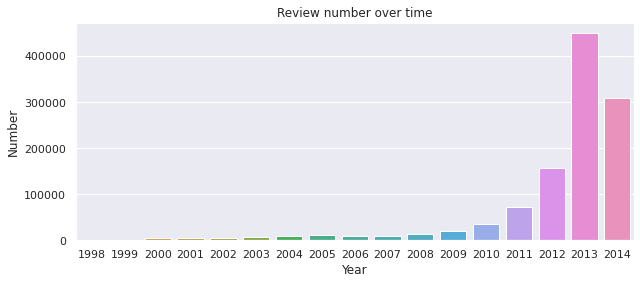

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

y_pd = {'Year':[], 'Number':[]}
# for k, item in year_h.items():
#     y_pd['year'].append(k)
#     y_pd['number'].append(item)

year_list = sorted([(int(k), int(item)) for k, item in year_h.items()], key=lambda k:k[0])

for data in year_list:
    y_pd['Year'].append(data[0])
    y_pd['Number'].append(data[1])

plt.figure(figsize=(10,4))
df = pd.DataFrame(y_pd)
# sns.relplot(x="Year", y="Number", data=df, facet_kws=dict(sharex=False));
ax = sns.barplot(x="Year", y="Number", data=df)
            #   color = 'black')
ax.set(ylabel='Number', xlabel='Year')
plt.title('Review number over time')
plt.savefig("year_number.png")

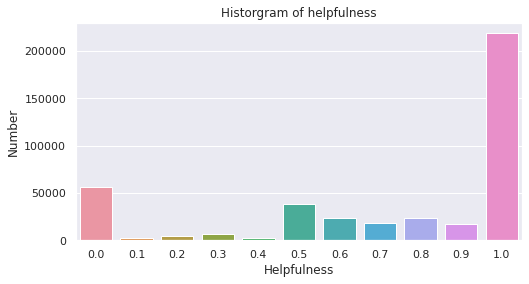

In [ ]:
helpfulness = {0: 56531,
 0.1: 1960,
 0.2: 4333,
 0.3: 7062,
 0.4: 2794,
 0.5: 38223,
 0.6: 23165,
 0.7: 18244,
 0.8: 23483,
 0.9: 17171,
 1: 218798}

y_pd = {'Helpfulness':[], 'Number':[]}
for k, item in helpfulness.items():
    y_pd['Helpfulness'].append(k)
    y_pd['Number'].append(item)
helpfulness = sorted([(k, int(item)) for k, item in helpfulness.items()], key=lambda k:k[0])

plt.figure(figsize=(8,4))
df = pd.DataFrame(y_pd)
# sns.relplot(x="Year", y="Number", data=df, facet_kws=dict(sharex=False));
ax = sns.barplot(x="Helpfulness", y="Number", data=df)
            #   color = 'black')
ax.set(ylabel='Number', xlabel='Helpfulness')
plt.title('Historgram of helpfulness')
plt.savefig("helpfulness.png")

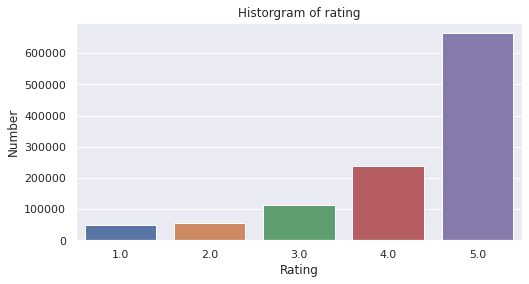

In [ ]:
rate = {'1.0': 49467, '2.0': 54171, '3.0': 113161, '4.0': 238174, '5.0': 663876}
y_pd = {'Rating':[], 'Number':[]}
for k, item in rate.items():
    y_pd['Rating'].append(k)
    y_pd['Number'].append(item)
rating = sorted([(k, int(item)) for k, item in rate.items()], key=lambda k:k[0])

plt.figure(figsize=(8,4))
df = pd.DataFrame(y_pd)
# sns.relplot(x="Year", y="Number", data=df, facet_kws=dict(sharex=False));
ax = sns.barplot(x="Rating", y="Number", data=df)
            #   color = 'black')
ax.set(ylabel='Number', xlabel='Rating')
plt.title('Historgram of rating')
plt.savefig("rating.png")

In [ ]:
category_number = {"Clothing, Shoes and Jewelry":278677, "Cell Phones and Accessories":194439, "Toys and Games":167597, "Tools and Home Improvement":134476, "Office Products":53258, "Pet Supplies":147836, "Automotive":20473, 
                   "Digital Music":64706, "Musical Instruments":10261, "Amazon Instant Video":37126}

In [ ]:
category_number = {"Clothing":278677, "Phones":194439, "Toys":167597, "Tools":134476, "Office":53258, "Pet":147836, "Automotive":20473, 
                   "Music":64706, "Instruments":10261, "Video":37126}

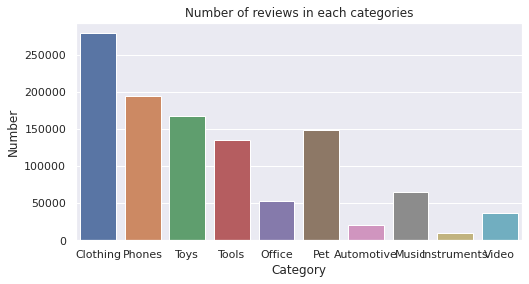

In [ ]:
# rate = {'1.0': 49467, '2.0': 54171, '3.0': 113161, '4.0': 238174, '5.0': 663876}
y_pd = {'Category':[], 'Number':[]}
for k, item in category_number.items():
    y_pd['Category'].append(k)
    y_pd['Number'].append(item)
rating = sorted([(k, int(item)) for k, item in category_number.items()], key=lambda k:k[0])

plt.figure(figsize=(8,4))
df = pd.DataFrame(y_pd)
# sns.relplot(x="Year", y="Number", data=df, facet_kws=dict(sharex=False));
ax = sns.barplot(x="Category", y="Number", data=df)
            #   color = 'black')
ax.set(ylabel='Number', xlabel='Category')
plt.title('Number of reviews in each categories')
plt.savefig("Category.png")

In [ ]:
country_worth2lookat = {'china':['china', 'ch'], 'us':['usa', 'us', 'america', 'united states', 'the states'], 
                      'uk':['uk', 'england', 'britain', 'ireland', 'scotland'], 'japan':['japan'], 'mexico':['mexico'], 'germany': ['germany'], 
                      'canada':['canada'], 'india':['india'], 'australia':['australia'], 'taiwan':['taiwan'], 'vietnam':['vietnam'], 
                      'thailand':['thailand'], 'korea':['korea'], 'iraq':['iraq'], 'russia':['russia']} #15


nationality_worth2lookat = {'american': ['american'], 'english': ['english'], 'german':['german'], 
                          'chinese':['chinese'], 'british':['british', 'scottish', 'irish'], 
                          'spanish':['spanish'], 'french':['french'], 'japanese':['japanese'], 
                          'european':['european'], 'australian':['australian'], 
                          'african':['african'], 'asian':['asian'], 'italian':['italian'], 
                          'canadian':['canadian'],  'indian':['indian'], 
                          'russian':['russian'], 'mexican':['mexican']} # 17

# build word2label
word2label_country = {}
word2label_nationality = {}
for key, item in country_worth2lookat.items():
    for word in item:
        word2label_country[word] = key
for key, item in nationality_worth2lookat.items():
    for word in item:
        word2label_nationality[word] = key

In [ ]:
stats = {k:0 for k in country_worth2lookat}
for k, item in dist.items():
    for k in stats:
        stats[k] += item[k]

print(stats)

{'china': 7495, 'us': 14333, 'uk': 3328, 'japan': 807, 'mexico': 708, 'germany': 579, 'canada': 553, 'india': 572, 'australia': 449, 'taiwan': 268, 'vietnam': 250, 'thailand': 195, 'korea': 177, 'iraq': 119, 'russia': 123}


## Get the distribution of the rating for country of origin dataset

In [ ]:
import copy
import json

with open('purpose_classification_new/entire_training/entire_dataset_inference_results.json', 'r') as f:
    zexing = json.load(f)

total=[]

for k, i in zexing.items():
    if i == 0:
        total.append(k)

print(len(total))

# for item in total:
#     if item[-1] == 1:
#         idxes.append(k)
idxes = total
names = {name:set() for name in done}
for idx in idxes:
    data = idx2data[idx]
    names[data['category']].add(int(data['row_idx']))

n_row2rate = {}
for name, idx_ in names.items():
    for row, data in enumerate(open(name+'.json', 'r')):
        if row in idx_:
            review = json.loads(data)
            n_row2rate[(name, row)] = review['overall']

country_rate = {k:{1:0, 2:0, 3:0, 4:0, 5:0} for k in country_worth2lookat}

for idx in idxes:
    data = idx2data[idx]
    country_n = data['country_name'].lower()
    if country_n in country_rate:
        rate = n_row2rate[(data['category'], data['row_idx'])]
        country_rate[country_n][rate] += 1

print(country_rate)
